In [75]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import os
import utils

%matplotlib inline

plt.rcParams['figure.figsize'] = (20.0, 200.0)
plt.rcParams['image.interpolation'] = 'bilinear'

INPUT_DIR = 'data/prepared/'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [86]:
images = utils.load_images(INPUT_DIR)
m_images = utils.load_images('data/marking/')
boxes_dict = {}
for name in m_images:
    img = m_images[name]
    boxes_dict[name] = utils.mark2cnt(img, (7, 2, 251))

In [87]:
def annotate(d=20, sigma=200, blockSize=39, e=0.006, min_h_len=8, min_area_rate=0.42):
    cnts_dict = {}
    hulls_dict = {}
    ths = []
    for file_name in images:
        img = images[file_name]
        nonoise = cv.bilateralFilter(img, d, sigma, sigma)
        gray = cv.cvtColor(nonoise, cv.COLOR_BGR2GRAY)
        th = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, blockSize, 2)
        ths.append(th)
        _, contours, _ = cv.findContours(th, cv.RETR_LIST, cv.CHAIN_APPROX_TC89_KCOS)
        hulls = []
        approx_contours = []
        for contour in contours:
            epsilon = e * cv.arcLength(contour, True)
            approx = cv.approxPolyDP(contour, epsilon, True)
            hull = cv.convexHull(approx)
            cnt_area = cv.contourArea(approx)
            hull_area = cv.contourArea(hull)
            area_rate = 0
            if hull_area != 0:
                area_rate = cnt_area / hull_area
            if hull_area > 400 and area_rate > min_area_rate and len(hull) > min_h_len:
                hulls.append(hull)
            approx_contours.append(approx)
        cnts_dict[file_name] = approx_contours
        hulls_dict[file_name] = hulls
        cv.drawContours(img, hulls, -1, (255, 0, 0), 1)
    return cnts_dict, hulls_dict

In [71]:
def get_avg_iou(cnts_dict):
    iou_list = []
    iou_dict = {}
    for name, boxes in boxes_dict.items():
        try:
            img = images[name]
            cnts = cnts_dict[name]
            iou = utils.iou(img.shape, cnts, boxes)
            iou_list.append(iou)
            iou_dict[name] = iou
        except KeyError:
            pass
    return sum(iou_list) / len(iou_list)

In [72]:
v_list = range(1)
cnts_results = []
hulls_results = []
for v in v_list:
    cnts, hulls = annotate(min_h_len=v)
    cnts_result = get_avg_iou(cnts)
    hulls_result = get_avg_iou(hulls)
    cnts_results.append(cnts_result)
    hulls_results.append(hulls_result)
    print('{} h: {}\tc: {}'.format(v, hulls_result, cnts_result))

3 h: 0.1487554416479724	c: 0.14896720909040542
4 h: 0.12770232949945648	c: 0.15440778751780973
5 h: 0.16970431509169423	c: 0.15527226232140273
6 h: 0.16810063708356274	c: 0.15607539214986926
7 h: 0.16341544871040803	c: 0.1573712213382425
8 h: 0.16117939143970603	c: 0.15685081206030355
9 h: 0.07239227141150506	c: 0.15678085238521086
10 h: 0.003955239868817877	c: 0.156656763437796
11 h: 0.0	c: 0.1566538424719009
12 h: 0.0	c: 0.1566538424719009
13 h: 0.0	c: 0.1566538424719009
14 h: 0.0	c: 0.1566538424719009


In [ ]:
plt.plot(v_list, cnts_results, label='cnts')
plt.plot(v_list, hulls_results, label='hulls')
plt.legend(loc='best')
plt.grid()
plt.show()

In [7]:
utils.export_contours_csv("via2.csv", hulls_dict)

NameError: name 'hulls_dict' is not defined

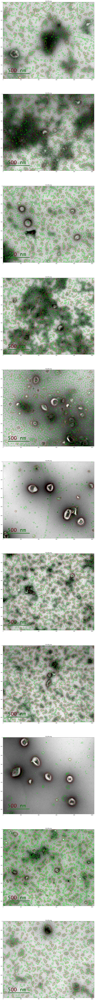

In [88]:
cnts, hulls = annotate()
n_rows = len(images)
n_cols = 1
# names = ['03 80k.png', '05 80k.png']
for i, name in enumerate(images):
    img = images[name]
    cv.drawContours(img, cnts[name], -1, (0, 255, 0))
    cv.drawContours(img, hulls[name], -1, (255, 0, 0))
    plt.subplot(n_rows, n_cols, i + 1)
    plt.title(file)
    plt.imshow(img)
#     plt.subplot(n_rows, n_cols, i + 2)
#     plt.title(file)
#     plt.imshow(ths[i], cmap='gray')
plt.show()